# wordslab-images - Black Forest Labs FLUX.1-dev

FLUX.1 \[dev\] is a 12 billion parameter model from Black Forest Labs capable of generating images from text descriptions. 

Key Features
- Cutting-edge output quality
- Competitive prompt following, matching the performance of closed source alternatives .
- Trained using guidance distillation, making FLUX.1 \[dev\] more efficient.
- Open weights to drive new scientific research, and empower artists to develop innovative workflows.
- Generated outputs can be used for personal, scientific, and commercial purposes as described in the  [FLUX.1 \[dev\] Non-Commercial License](https://huggingface.co/black-forest-labs/FLUX.1-dev/blob/main/LICENSE.md).

b. Non-Commercial Use Only. You may only access, use, Distribute, or create Derivatives of the FLUX.1 \[dev\] Model or Derivatives for Non-Commercial Purposes. If you want to use a FLUX.1  \[dev\] Model or a Derivative for any purpose that is not expressly authorized under this License, such as for a commercial activity, you must request a license from Company, which Company may grant to you in Company’s sole discretion and which additional use may be subject to a fee, royalty or other revenue share. Please see [www.bfl.ai](www.bfl.ai) if you would like a commercial license.

d. Outputs. We claim no ownership rights in and to the Outputs. You are solely responsible for the Outputs you generate and their subsequent uses in accordance with this License. You may use Output for any purpose (including for commercial purposes), except as expressly prohibited herein. You may not use the Output to train, fine-tune or distill a model that is competitive with the FLUX.1 \[dev\] Model or the FLUX.1 Kontext \[dev\] Model.

## Install Huggingface diffusers library

In [1]:
!uv add diffusers

Resolved 256 packages in 0.56ms
Audited 151 packages in 1ms


In [2]:
!uv add accelerate

Resolved 256 packages in 0.55ms
Audited 151 packages in 1ms


## Model variant for Nvidia RTX 4090 or Nvidia RTX 5090 GPU

This version of the model requires 24 GB of VRAM and FP8 support.

The code below will download 17 GB of model weights.

Generating a full quality 1024x1024 image takes 36 seconds on a RTX 4090.

### Load the FLUX.1 \[dev\] models and pipeline

In [2]:
!uv add torchao==0.11.0

Resolved 256 packages in 0.59ms
Audited 151 packages in 1ms


In [3]:
import torch
from diffusers import FluxPipeline

pipe = FluxPipeline.from_pretrained(
    "diffusers/FLUX.1-dev-torchao-fp8",
    torch_dtype=torch.bfloat16,
    use_safetensors=False,
    device_map="cuda"
)

/home/workspace/wordslab-images/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...:   0%|                                                             | 0/7 [00:00<?, ?it/s]`torch_dtype` is deprecated! Use `dtype` instead!

Loading pipeline components...: 100%|█████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.86s/it]


### Configure the image generation pipeline

In [4]:
pipe_kwargs = {
    # Image resolution
    "height": 1024, "width": 1024,
    # Increase for stricter prompt adherence, Decrease for looser prompt adherence 
    "guidance_scale": 3.5,
    # Decrease for faster generation but less details and worse quality
    "num_inference_steps": 50,
    # Maximum size of the prompt (in tokens)
    "max_sequence_length": 512,
}

def generate_image(prompt, reproducible_output=False):
    # Set reproducible_output to true to always get the same image
    if reproducible_output:
        return pipe(prompt=prompt, **pipe_kwargs, generator=torch.manual_seed(0)).images[0]
    # Otherwise each generation will give you a different image
    else:
         return pipe(prompt=prompt, **pipe_kwargs).images[0]

### Generate and display images

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [00:36<00:00,  1.38it/s]


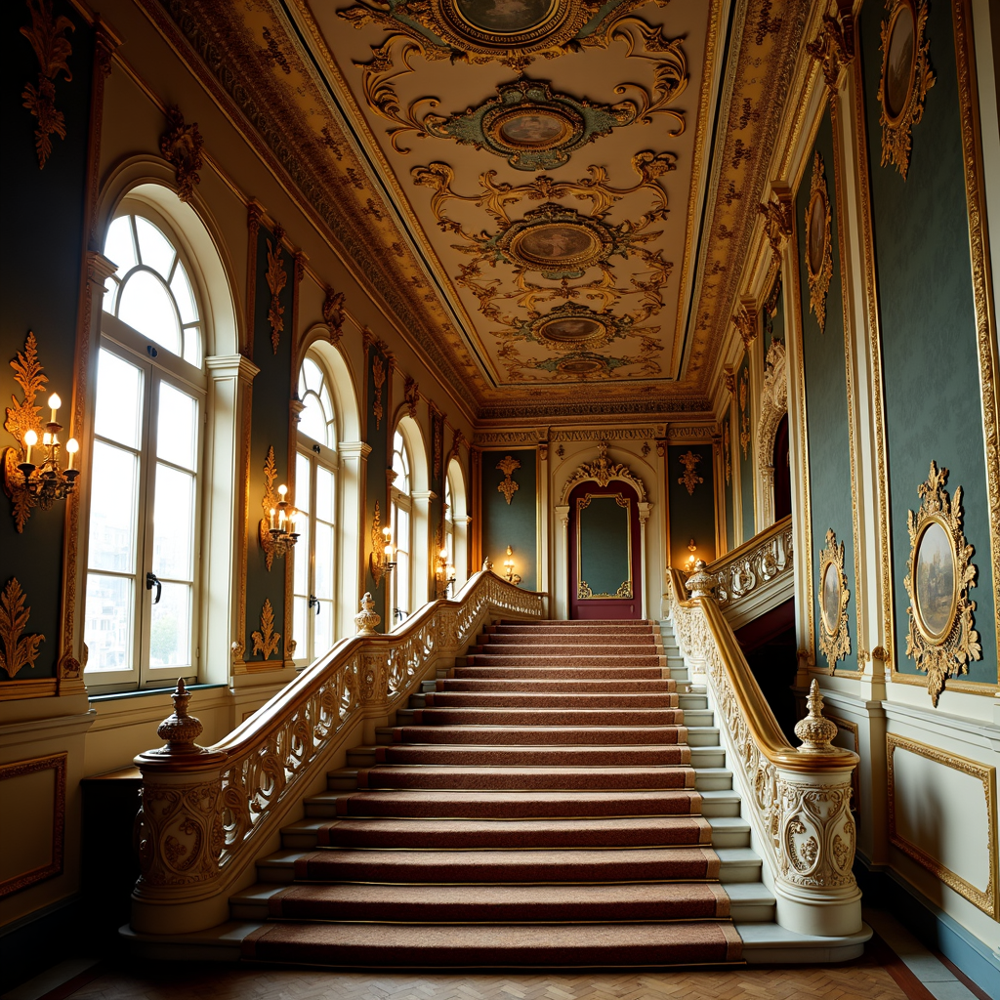

In [5]:
prompt = "Baroque style, a lavish palace interior with ornate gilded ceilings, intricate tapestries, and dramatic lighting over a grand staircase."

image = generate_image(prompt, reproducible_output=True)

image

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [00:36<00:00,  1.38it/s]


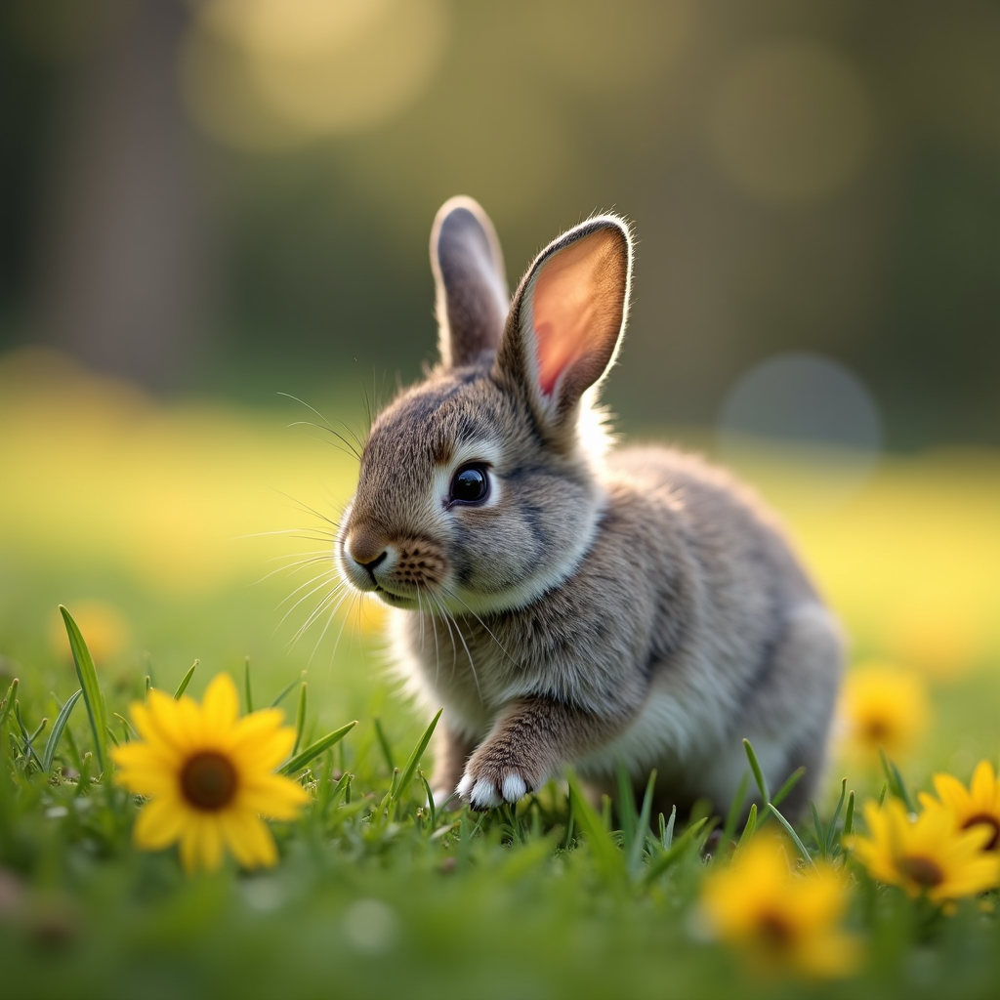

In [9]:
prompt = "A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, realistic cinematic shot"

image = generate_image(prompt)

image

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [00:36<00:00,  1.38it/s]


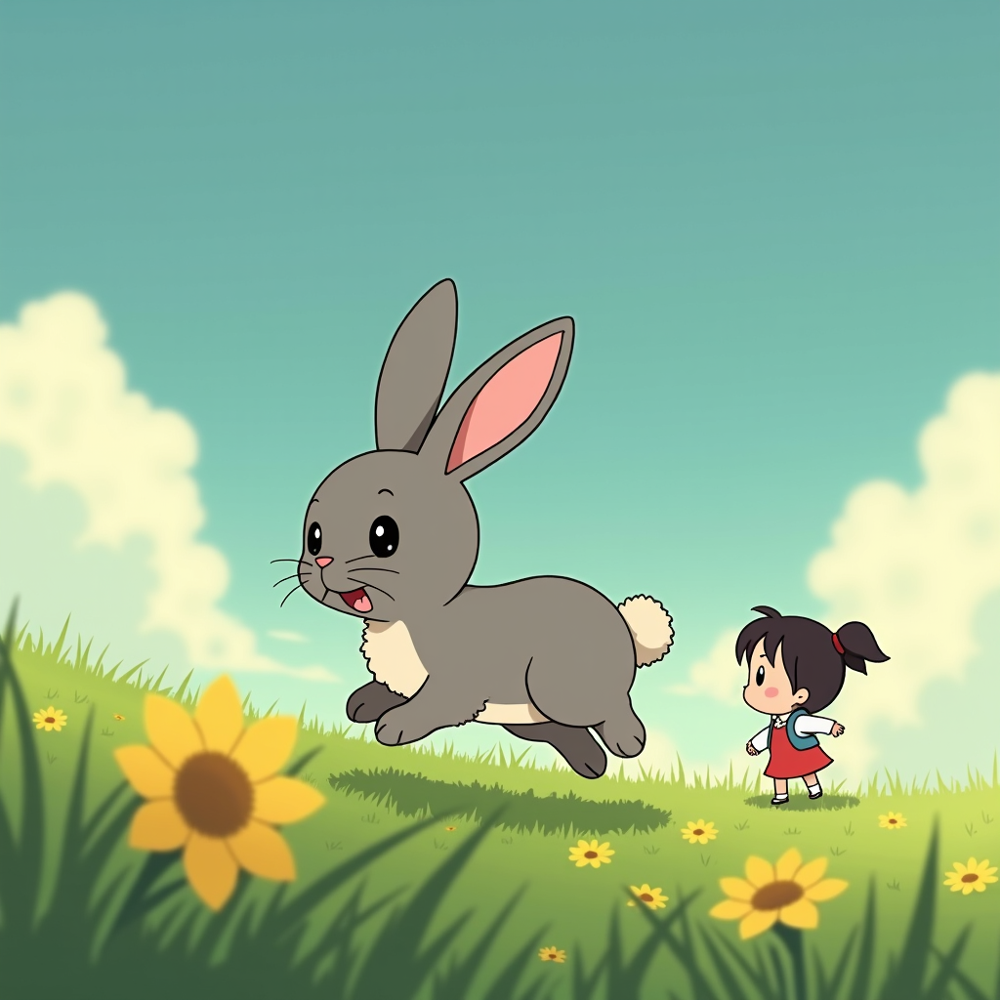

In [10]:
prompt = "A very cute small grey rabbit with small ears, running on grass with yellow flowers, a young girl is watching it, ghibli style anime"

image = generate_image(prompt)

image

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [00:36<00:00,  1.38it/s]


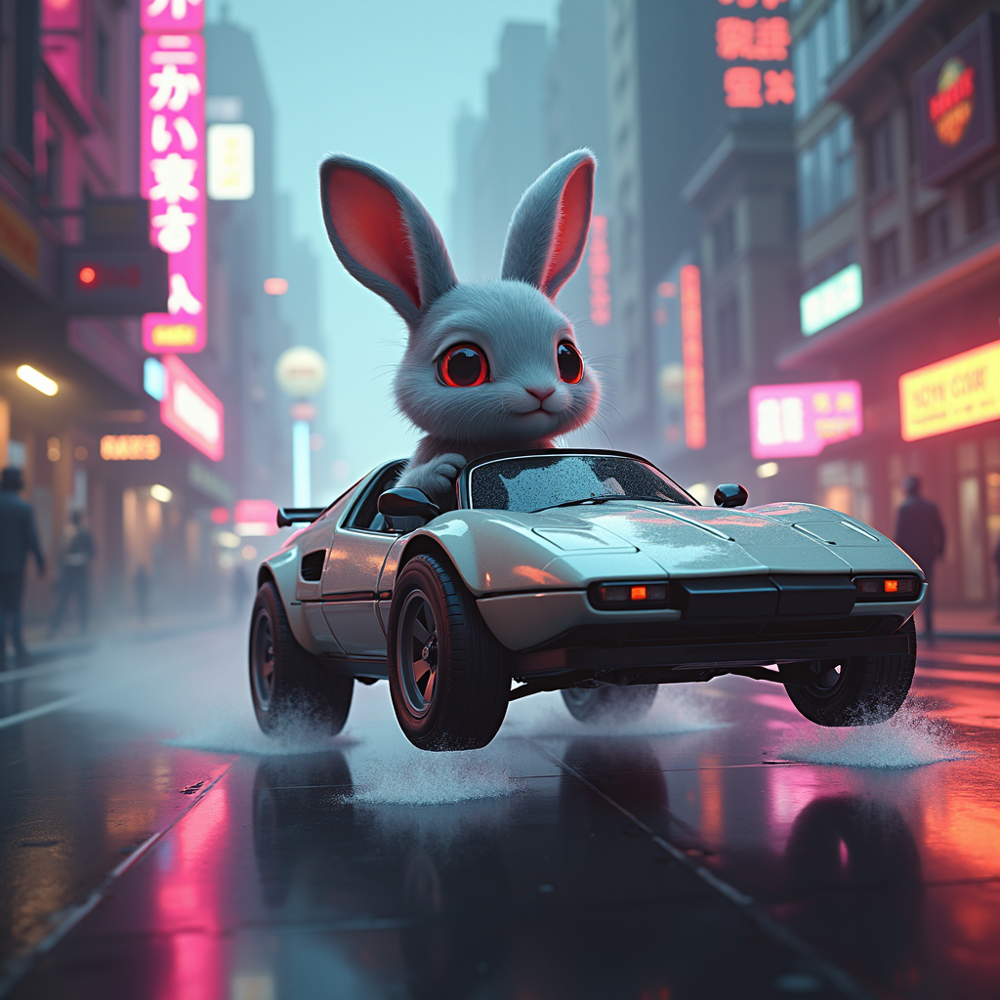

In [14]:
prompt = "A sci-fi movie poster where a small grey cybernetic rabbit is driving a flying car in a post apocalyptic city full of neons"

image = generate_image(prompt)

image

### Save the generated image

In [15]:
image.save("rabbit.jpg")

## Model variant for Nvidia RTX 3000+ with 16 GB VRAM

This version of the model requires 16 GB of VRAM and int4 support.

The code below will download 12.5 GB of model weights.

Generating a full quality 1024x1024 image takes 32 seconds on a RTX 4090.

### Load the FLUX.1 \[dev\] models and pipeline

In [1]:
!uv add bitsandbytes

Resolved 257 packages in 0.53ms
Audited 152 packages in 0.99ms


In [1]:
import torch
from diffusers import FluxPipeline

pipe = FluxPipeline.from_pretrained(
    "diffusers/FLUX.1-dev-bnb-4bit",
    torch_dtype=torch.bfloat16,
    device_map="balanced"
)

/home/workspace/wordslab-images/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading pipeline components...:  14%|███████▌                                             | 1/7 [00:00<00:00,  7.64it/s]`torch_dtype` is deprecated! Use `dtype` instead!

Loading pipeline components...: 100%|█████████████████████████████████████████████████████| 7/7 [00:15<00:00,  2.18s/it]


### Configure the image generation pipeline

In [2]:
pipe_kwargs = {
    # Image resolution
    "height": 1024, "width": 1024,
    # Increase for stricter prompt adherence, Decrease for looser prompt adherence 
    "guidance_scale": 3.5,
    # Decrease for faster generation but less details and worse quality
    "num_inference_steps": 50,
    # Maximum size of the prompt (in tokens)
    "max_sequence_length": 512,
}

def generate_image(prompt, reproducible_output=False):
    # Set reproducible_output to true to always get the same image
    if reproducible_output:
        return pipe(prompt=prompt, **pipe_kwargs, generator=torch.manual_seed(0)).images[0]
    # Otherwise each generation will give you a different image
    else:
         return pipe(prompt=prompt, **pipe_kwargs).images[0]

### Generate and display images

100%|███████████████████████████████████████████████████████████████████████████████████| 50/50 [00:32<00:00,  1.54it/s]


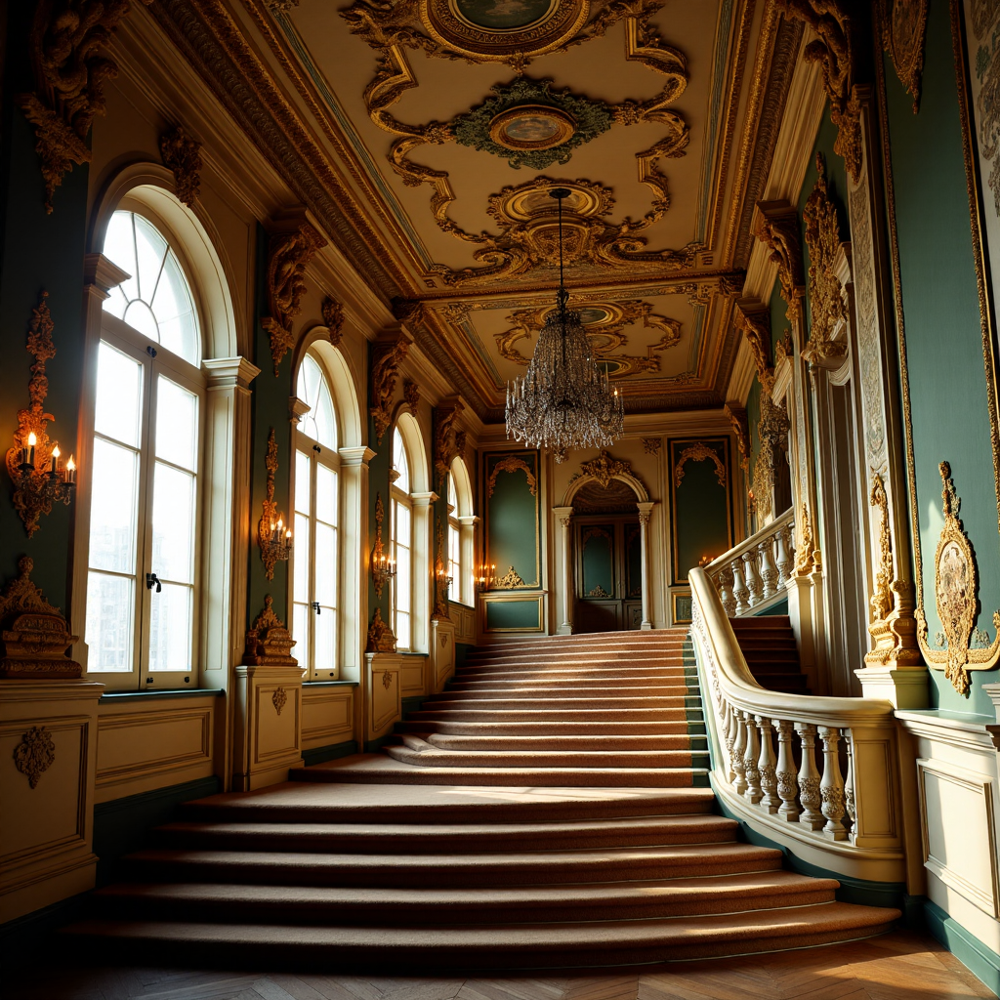

In [4]:
prompt = "Baroque style, a lavish palace interior with ornate gilded ceilings, intricate tapestries, and dramatic lighting over a grand staircase."

image = generate_image(prompt, reproducible_output=True)

image

## Web interface to generate images

In [ ]:
!uv add gradio

In [3]:
import gradio as gr

with gr.Blocks() as app:
    gr.Markdown("# FLUX.1 [dev] image generator")
    textbox = gr.Textbox(lines=1, placeholder="Describe the image you want to generate ...", show_label=False)
    button = gr.Button("Generate", variant="primary")
    image = gr.Image(height=1024, width=1024, format="png")
    button.click(generate_image, inputs=textbox, outputs=image)

In [4]:
import os
port = os.getenv("USER_APP1_PORT")
url = os.getenv("USER_APP1_URL")

In [5]:
app.launch(server_name="0.0.0.0", server_port=int(port), inline=False)

* Running on local URL:  http://0.0.0.0:8883
* To create a public link, set `share=True` in `launch()`.


In [6]:
url

'https://127.0.0.1:8883'

 38%|███████████████████████████████▌                                                   | 19/50 [00:12<00:20,  1.54it/s]

In [29]:
app.close()